#### Experiments in one-dimension.

In [1]:
using Plots
using JLD 
using Clustering
using TimeIt
include("logistic_functions.jl")

compare_1d (generic function with 1 method)

#### Define some functions for all the loops etc:

In [2]:
function acf(x, maxlag)
    n = length(x)
    acf_vec = zeros(maxlag+1)
    xmean = mean(x)
    for lag in 0:maxlag
        index, index_shifted = 1:(n-lag), (lag+1):n
        acf_vec[lag+1] = mean((x[index]-xmean).*(x[index_shifted]-xmean))
    end
    acf_vec
end

acf (generic function with 1 method)

In [3]:
function logistic_data(d, Nobs, beta, X_type="normal") 
    if X_type == "normal"
        X = rand(Normal(), d, Nobs)
    elseif X_type == "uniform"
        X = rand(d, Nobs)
    end 
    y = [rand(1)[1] < 1/(1 + exp(-dot(beta,X[:,i]))) for i in 1:Nobs] .+ 0
    X, y
end

logistic_data (generic function with 2 methods)

In [49]:
function plot_acfs(samples, maxlag) 
    plot(size=(900,250), layout=(1,4))
    
    plot!(0:maxlag, acf(samples[1,1,1][1,:], maxlag), subplot=1, label="", lw=2, ylabel="ACF")
    plot!(0:maxlag, acf(samples[1,1,2][1,:], maxlag), subplot=1, label="", lw=2, xlabel="lag")
    plot!(0:maxlag, acf(samples[1,1,3][1,:], maxlag), subplot=1, label="", lw=2)
    plot!(0:maxlag, acf(samples[1,1,4][1,1:min(end,length(samples_u[1,1,1]))], maxlag), subplot=1, label="", lw=2, title="1 cluster")

    plot!(0:maxlag, acf(samples[1,2,1][1,:], maxlag), subplot=2, label="", lw=2, xlabel="lag")
    plot!(0:maxlag, acf(samples[1,2,2][1,:], maxlag), subplot=2, label="", lw=2)
    plot!(0:maxlag, acf(samples[1,2,3][1,:], maxlag), subplot=2, label="", lw=2)
    plot!(0:maxlag, acf(samples[1,2,4][1,1:min(end,length(samples_u[1,1,1]))], maxlag), subplot=2, label="", lw=2, title="2 clusters")

    plot!(0:maxlag, acf(samples[1,4,1][1,:], maxlag), subplot=3, label="", lw=2, xlabel="lag")
    plot!(0:maxlag, acf(samples[1,4,2][1,:], maxlag), subplot=3, label="", lw=2)
    plot!(0:maxlag, acf(samples[1,4,3][1,:], maxlag), subplot=3, label="", lw=2)
    plot!(0:maxlag, acf(samples[1,4,4][1,1:min(end,length(samples_u[1,1,1]))], maxlag), subplot=3, label="", lw=2, title="4 clusters")

    plot!(0:maxlag, acf(samples[1,7,1][1,:], maxlag), subplot=4, label="iid", lw=2, xlabel="lag")
    plot!(0:maxlag, acf(samples[1,7,2][1,:], maxlag), subplot=4, label="wor", lw=2)
    plot!(0:maxlag, acf(samples[1,7,3][1,:], maxlag), subplot=4, label="sorted", lw=2)
    plot!(0:maxlag, acf(samples[1,4,4][1,1:min(end,length(samples_u[1,1,1]))], maxlag), subplot=4, label="CV", lw=2, title="12 clusters (4 for CV)")
end

plot_acfs (generic function with 1 method)

In [22]:
function iacts(samples, N_clusters, maxlag)
    rep = size(samples)[1]
    iacts = zeros(rep, length(N_clusters), 4)
    for r in 1:rep
        for i in 1:length(N_clusters) 
            for j in 1:3
                iacts[r,i,j] = sum(acf(samples[r,i,j][1,:], maxlag))
            end
            if i < 4 
                iacts[r,i,4] = sum(acf(samples[r,i,4][1,1:min(end,length(samples_u[1,1,1]))], maxlag))
            end
        end
    end
    iacts
end

iacts (generic function with 1 method)

#### Sanity checks:

In [6]:
beta = ones(1)
beta_0 = ones(1,1)
X, y = logistic_data(1, 100, beta, "normal");

In [11]:
max_attempts = 10^6
h = 1/10

@timeit skeletons_iid, bouncing_iid = ZZ_log_mb(X, y, max_attempts, beta_0, 60, true, false)
@timeit samples_iid = extract_samples(skeletons_iid, bouncing_iid, h)

@timeit skeletons_wor, bouncing_wor = ZZ_log_mb(X, y, max_attempts, beta_0, 60, false, false)
@timeit samples_wor = extract_samples(skeletons_wor, bouncing_wor, h)

@timeit clusters, centers = form_sorted_clusters(X, y, 1, 60) 
@timeit skeletons_sorted, bouncing_sorted = ZZ_log_C(X, clusters, centers, max_attempts, beta_0, "uniform", false)
@timeit samples_sorted = extract_samples(skeletons_sorted, bouncing_sorted, h);

1 loops, best of 3: 19.05 s per loop
10 loops, best of 3: 12.81 ms per loop
1 loops, best of 3: 20.89 s per loop
10 loops, best of 3: 12.78 ms per loop
1000 loops, best of 3: 230.36 µs per loop
1 loops, best of 3: 64.93 s per loop
10 loops, best of 3: 12.51 ms per loop


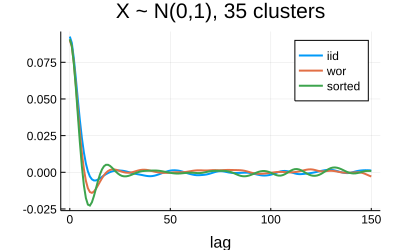

In [13]:
plot(size=(400,250))
maxlag = 150
plot!(0:maxlag, acf(samples_iid[1,:], maxlag), label="iid", lw=2, xlabel="lag")
plot!(0:maxlag, acf(samples_wor[1,:], maxlag), label="wor", lw=2, title="X ~ N(0,1), 35 clusters")
plot!(0:maxlag, acf(samples_sorted[1,:] , maxlag), label="sorted", lw=2)

### Run everything

### $X \sim \mathcal{U}(0,1)$

In [14]:
beta = ones(1)
beta_0 = ones(1,1)
X_u, y_u = logistic_data(1, 100, beta, "uniform");

In [79]:
rep = 10
N_clusters = [1:4; 6:3:20; 25:5:50; 60:10:100]
h = 1/10;

In [80]:
start = time()
skeletons_u, bouncing_times_u, samples_u = compare_1d(X_u, y_u, N_clusters, beta_0, 2*10^6, rep, h);
print(round((time()-start)/60,2), " minutes")

578.35 minutes

#### Plot one instance of ACF's for a sanity check:

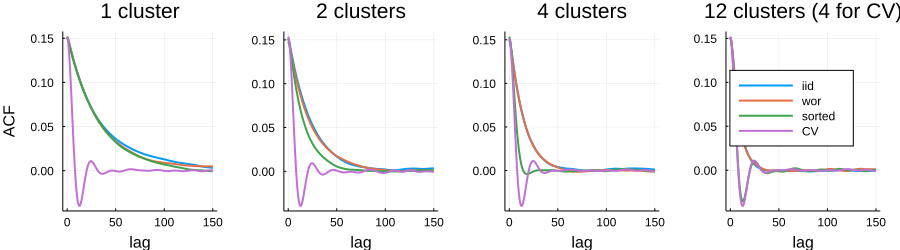

In [81]:
plot_acfs(samples_u, 150) 

In [82]:
maxlag = 200
iacts_u = iacts(samples_u, N_clusters, maxlag);

#### Plot IACT's:

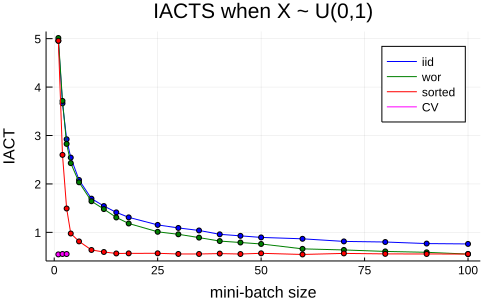

In [89]:
plot(size=(500,300))
plot!(N_clusters, reshape(mean(iacts_u[:,:,1],1),20), label="iid", ylabel="IACT", 
      xlabel="mini-batch size", color=:blue, title="IACTS when X ~ U(0,1)")
scatter!(N_clusters, reshape(mean(iacts_u[:,:,1],1),20), label="", markersize=3, color=:blue)
plot!(N_clusters, reshape(mean(iacts_u[:,:,2],1),20), label="wor", color=:green)
scatter!(N_clusters, reshape(mean(iacts_u[:,:,2],1),20), label="", markersize=3, color=:green)
plot!(N_clusters, reshape(mean(iacts_u[:,:,3],1),20), label="sorted", color=:red)
scatter!(N_clusters, reshape(mean(iacts_u[:,:,3],1),20), label="", markersize=3, color=:red)
plot!(N_clusters[1:3], reshape(mean(iacts_u[:,1:3,4],1),3), label="CV", color=:magenta)
scatter!(N_clusters[1:3], reshape(mean(iacts_u[:,1:3,4],1),3), label="", markersize=3, color=:magenta)

In [90]:
savefig("IACTS_logistic_uniform_x")

In [91]:
save("iacts_u.jld", "iacts_u", iacts_u)

### $X \sim \mathcal{N}(0,1)$

In [88]:
X_n, y_n = logistic_data(1, 100, beta, "normal");

In [75]:
rep = 10
start = time()
skeletons_n, bouncing_times_n, samples_n = compare_1d(X_n, y_n, N_clusters, beta_0, 2*10^6, rep, h);
print(round((time()-start)/60,2), " minutes")

571.58 minutes

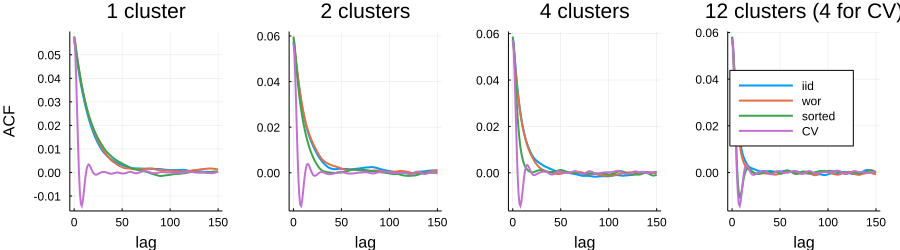

In [76]:
plot_acfs(samples_n, 150) 

In [77]:
maxlag = 200
iacts_n = iacts(samples_n, N_clusters, maxlag);

#### Plot IACT's:

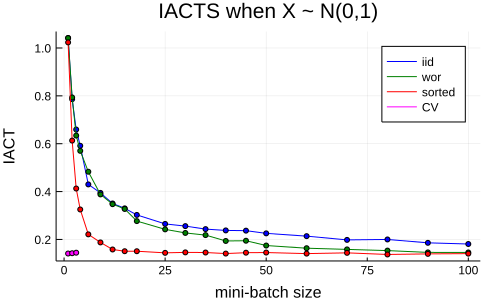

In [92]:
plot(size=(500,300))
plot!(N_clusters, reshape(mean(iacts_n[:,:,1],1),20), label="iid", ylabel="IACT", 
      xlabel="mini-batch size", color=:blue, title="IACTS when X ~ N(0,1)")
scatter!(N_clusters, reshape(mean(iacts_n[:,:,1],1),20), label="", markersize=3, color=:blue)
plot!(N_clusters, reshape(mean(iacts_n[:,:,2],1),20), label="wor", color=:green)
scatter!(N_clusters, reshape(mean(iacts_n[:,:,2],1),20), label="", markersize=3, color=:green)
plot!(N_clusters, reshape(mean(iacts_n[:,:,3],1),20), label="sorted", color=:red)
scatter!(N_clusters, reshape(mean(iacts_n[:,:,3],1),20), label="", markersize=3, color=:red)
plot!(N_clusters[1:3], reshape(mean(iacts_n[:,1:3,4],1),3), label="CV", color=:magenta)
scatter!(N_clusters[1:3], reshape(mean(iacts_n[:,1:3,4],1),3), label="", markersize=3, color=:magenta)

In [93]:
savefig("IACTS_logistic_gaussian_x")

In [94]:
save("iacts_n.jld", "iacts_n", iacts_n)

#### Other stuff

In [206]:
@timeit skeleton_CV , bouncing_CV  = ZZ_log_CV(X_u, y_u, 10^5, beta_0, 2, true, false)

1 loops, best of 3: 4.91 s per loop


4.910614069

In [207]:
@timeit skeleton_dH, bouncing_dH = ZZ_log_dom_Hess(X_u, y_u, 10^5, beta_0, false);

1 loops, best of 3: 1.83 s per loop


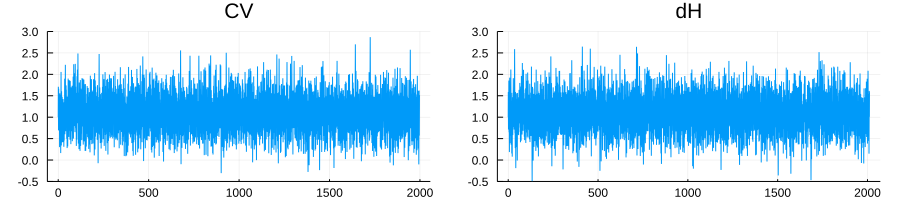

In [213]:
a = 2000
plot(size=(900,200), layout=(1,2))
plot!(bouncing_CV[1:a], skeleton_CV[1,1:a], title="CV", subplot=1, ylim=(-0.5,3), label="")
plot!(bouncing_dH[1:a], skeleton_dH[1,1:a], title="dH", subplot=2, ylim=(-0.5,3), label="")

In [214]:
samples_CV = extract_samples(skeleton_CV, bouncing_CV, 1/10)
samples_dH = extract_samples(skeleton_dH, bouncing_dH, 1/10)

1×715433 Array{Float64,2}:
 1.0  1.1  1.2  1.3  1.4  1.5  1.5788  …  0.630529  0.530529  0.430529

In [255]:
plot(log.((reshape(samples_CV[1,:],(length(samples_CV),)) .> 0)./reshape(1:length(samples_CV), length(samples_CV),)))
plot!(log.((reshape(samples_dH[1,:],(length(samples_dH),)) .> 0)./reshape(1:length(samples_dH), length(samples_dH),)))

#### Save data in files:

In [62]:
start = time()
save("/tmp/myfile.jld", "skeletons", skeletons, "bouncing_times", bouncing_times)
print(round((time()-start)/60,2), " minutes")

3.97 minutes